In [53]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
from scipy import signal as sg
%matplotlib inline

In [54]:
import skimage
import matplotlib.image as mpimg
import cv2
def image_read(image_path):
    image = cv2.imread(image_path) 
    #image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB) 
    return image.astype(np.float32)
def image_read_rgb(image_path):
    image = cv2.imread(image_path) 
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB) # ------> includes the conversion of color of the image with rgb
    return image.astype(np.float32)

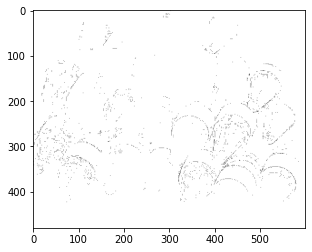

In [55]:
mosaic_image = image_read('/content/crayons.bmp')
plt.imshow(mosaic_image.astype(np.float32))

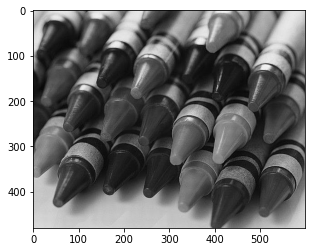

In [56]:
plt.imshow(mosaic_image.astype(np.uint8))

In [57]:
def linear_interpolation(mosaic_image):
   
    shape = np.shape(mosaic_image)
    image = np.zeros((shape[0], shape[1], 3))
    #Kernel weights
    Red_kernel = np.array([[1/4,2/4,1/4],[2/4,4/4,2/4],[1/4,2/4,1/4]]) 
    Green_kernel = np.array([[0/4,1/4,0/4],[1/4,4/4,1/4],[0/4,1/4,0/4]]) 
    Blue_kernel = np.array([[1/4,2/4,1/4],[2/4,4/4,2/4],[1/4,2/4,1/4]])
        
    Channel_r = mosaic_image[:,:,0]*np.tile(np.array([[1.0,0.0], [0.0,0.0]]),[int(shape[0]/2),int(shape[1]/2)]) #red filter       
    Channel_g = mosaic_image[:,:,1]*np.tile(np.array([[0.0,1.0], [1.0,0.0]]),[int(shape[0]/2),int(shape[1]/2)]) #green filter 
    Channel_b = mosaic_image[:,:,2]*np.tile(np.array([[0.0,0.0], [0.0,1.0]]),[int(shape[0]/2),int(shape[1]/2)]) #blue filter
    
    mosaic_image[:,:,0] = scipy.ndimage.convolve(Channel_r,Red_kernel,mode='constant')
    mosaic_image[:,:,1] = scipy.ndimage.convolve(Channel_g,Green_kernel,mode='constant')
    mosaic_image[:,:,2] = scipy.ndimage.convolve(Channel_b,Blue_kernel,mode='constant')
            
    return mosaic_image

In [58]:
def error(mosaic_image, original_image):
  
    squared_difference = (mosaic_image[:,:,0:3]-original_image[:,:,0:3])**2
    squared_error = np.sum(squared_difference, axis = 2)
    plt.figure(figsize=(16,8))
    plt.imshow(squared_error.astype(np.uint8),cmap = 'gray')
    plt.title('Squared error')
    average_error = np.mean(squared_error)
    maximum_error = squared_error.max()
    plt.colorbar()
  
    return average_error, maximum_error

Text(0.5, 1.0, 'Linear Interpolation Image')

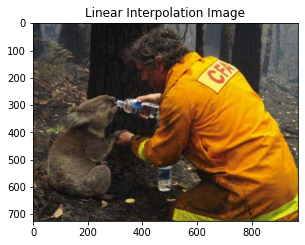

In [68]:
mosaic0_image = image_read('/content/hope.bmp')
output0_image = linear_interpolation(mosaic0_image)
#original_image = image_read('/content/crayons.jpg')
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.imshow(output0_image.astype(np.uint8))
plt.title('Linear Interpolation Image')
#plt.subplot(2,1,2)
#plt.imshow(original_image.astype(np.uint8))
#plt.title('Original Image')

Text(0.5, 1.0, 'Original Image')

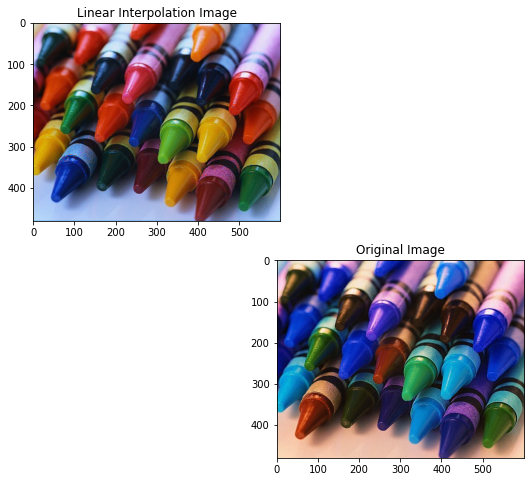

In [59]:
mosaic1_image = image_read('/content/crayons.bmp')
output1_image = linear_interpolation(mosaic1_image)
original_image = image_read('/content/crayons.jpg')
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.imshow(output1_image.astype(np.uint8))
plt.title('Linear Interpolation Image')
plt.subplot(2,1,2)
plt.imshow(original_image.astype(np.uint8))
plt.title('Original Image')

In [60]:
output1_image.shape

(480, 600, 3)

Text(0.5, 1.0, 'Original Image')

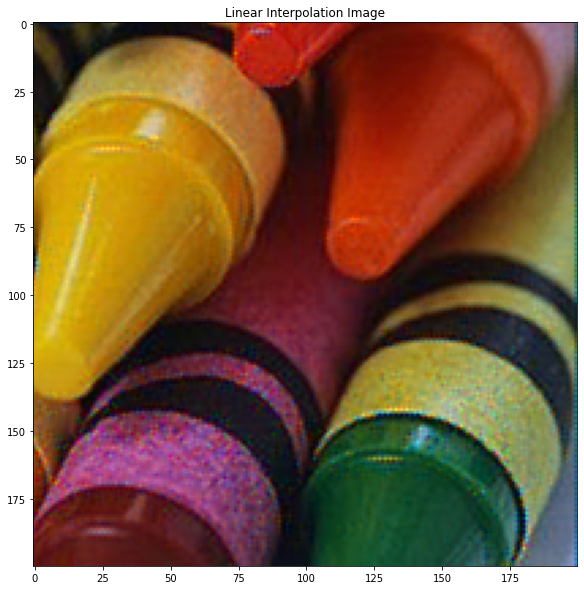

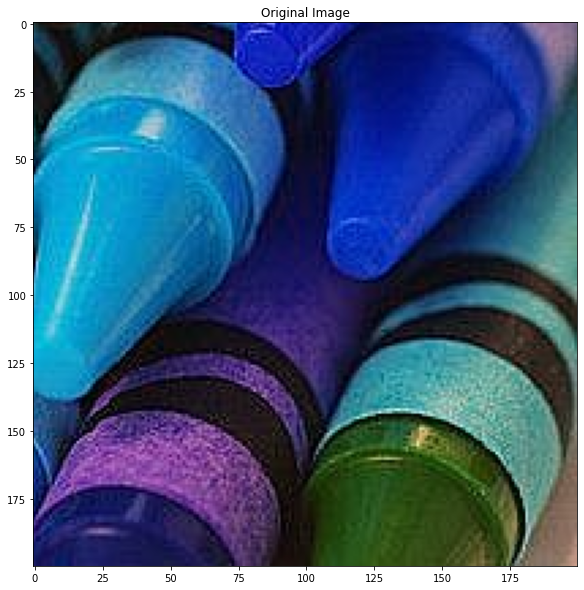

In [61]:
plt.figure(figsize= (10,10))
plt.imshow(output1_image[200:400,400:600,:].astype(np.uint8))
plt.title('Linear Interpolation Image')
plt.figure(figsize= (10,10))
plt.imshow(original_image[200:400,400:600,:].astype(np.uint8))
plt.title('Original Image')


Average per-pixel error: 15196.542
Maximum per-pixel error: 115386.31


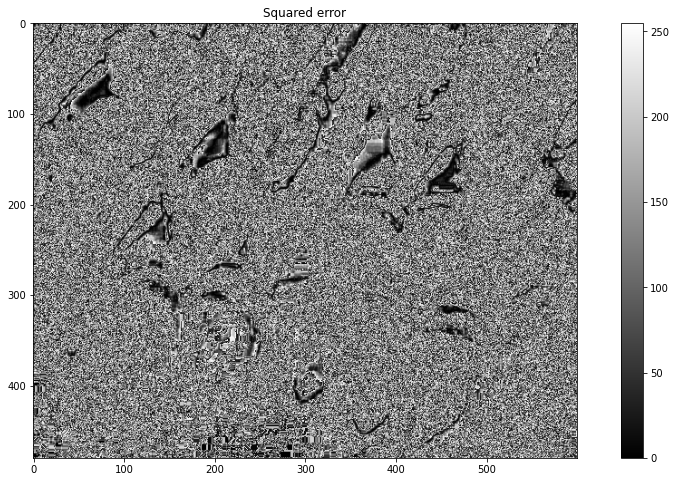

In [62]:
average_error, maximum_error = error(mosaic1_image, original_image)
print("Average per-pixel error: "+str(average_error))
print("Maximum per-pixel error: "+str(maximum_error))

Text(0.5, 1.0, 'Original Image')

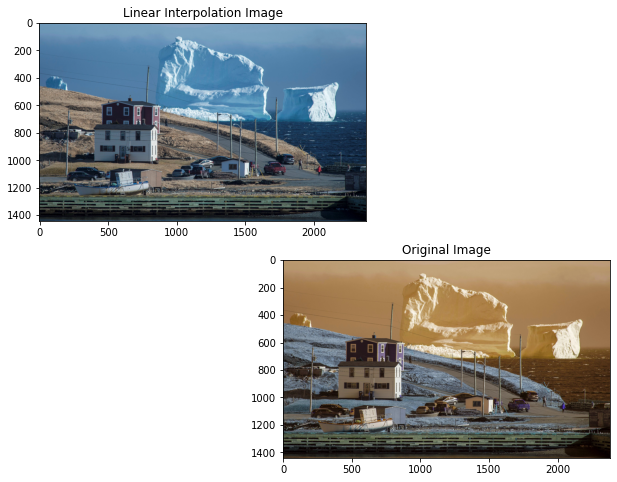

In [63]:
mosaic2_image = image_read('/content/iceberg.bmp')
output2_image = linear_interpolation(mosaic2_image)
original_image = image_read('/content/iceberg.jpg')
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.imshow(output2_image.astype(np.uint8))
plt.title('Linear Interpolation Image')
plt.subplot(2,1,2)
plt.imshow(original_image.astype(np.uint8))
plt.title('Original Image')

In [64]:
output2_image.shape

(1440, 2382, 3)

Text(0.5, 1.0, 'Original Image')

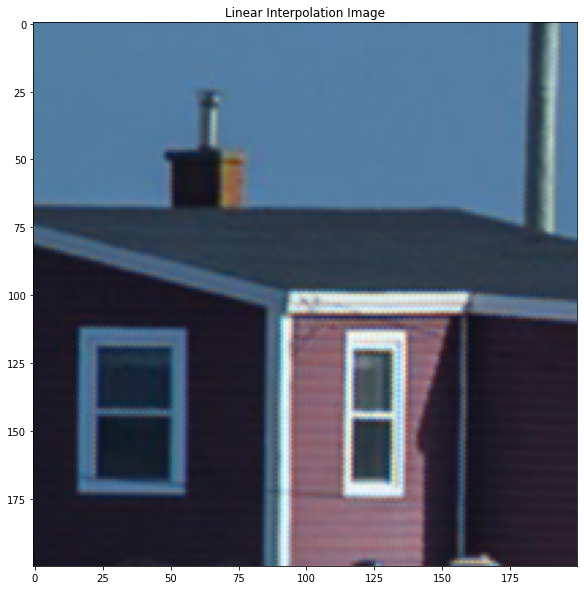

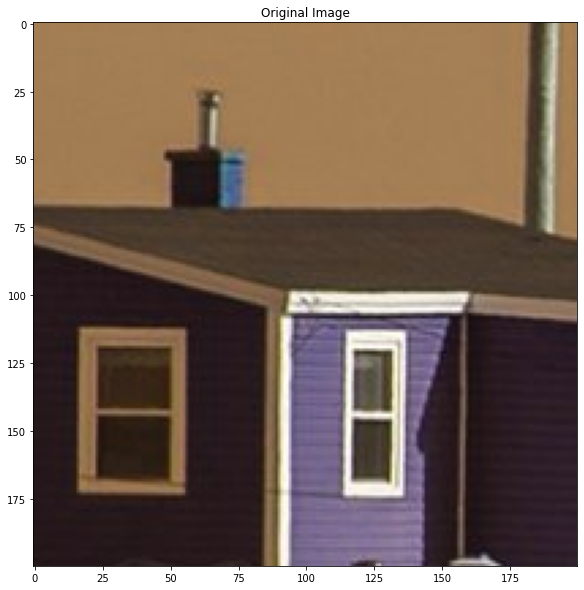

In [65]:
plt.figure(figsize= (10,10))
plt.imshow(output2_image[500:700,600:800,:].astype(np.uint8))
plt.title('Linear Interpolation Image')
plt.figure(figsize= (10,10))
plt.imshow(original_image[500:700,600:800,:].astype(np.uint8))
plt.title('Original Image')


Average per-pixel error: 7056.567
Maximum per-pixel error: 61787.25


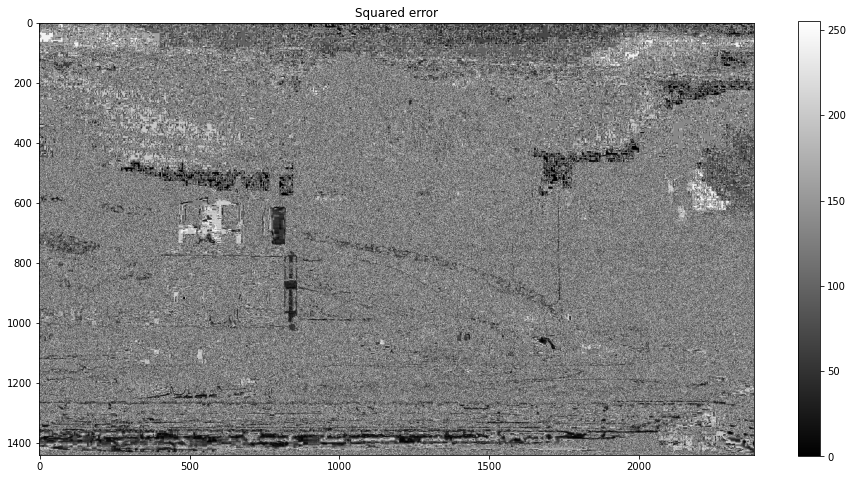

In [66]:
average_error, maximum_error = error(mosaic2_image, original_image)
print("Average per-pixel error: "+str(average_error))
print("Maximum per-pixel error: "+str(maximum_error))

Text(0.5, 1.0, 'Original Image')

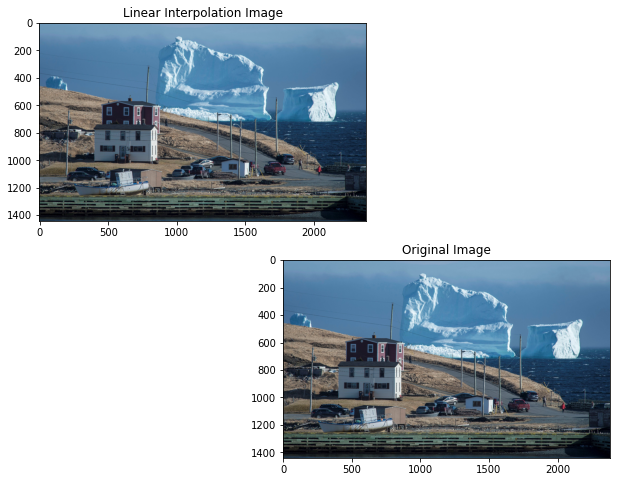

In [67]:
mosaic2_image = image_read_rgb('/content/iceberg.bmp')
output2_image = linear_interpolation(mosaic2_image)
original_image = image_read_rgb('/content/iceberg.jpg')
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.imshow(output2_image.astype(np.uint8))
plt.title('Linear Interpolation Image')
plt.subplot(2,1,2)
plt.imshow(original_image.astype(np.uint8))
plt.title('Original Image')

Average per-pixel error: 114.244774
Maximum per-pixel error: 30379.812


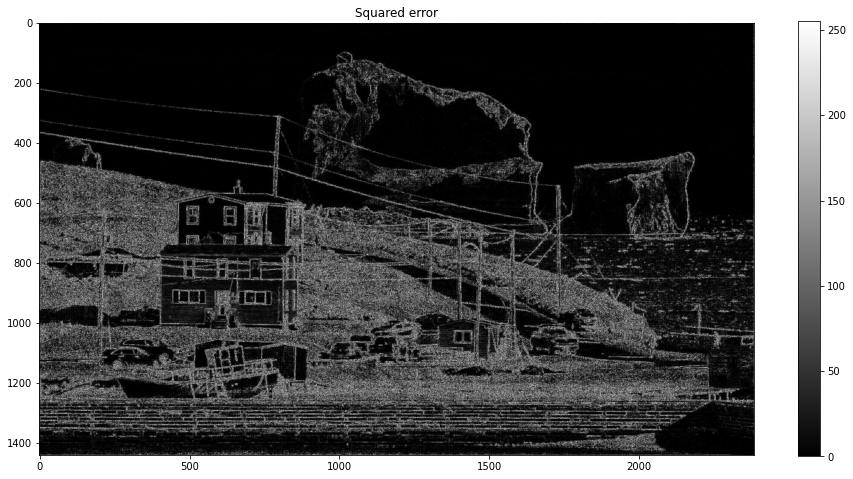

In [17]:
average_error, maximum_error = error(mosaic2_image, original_image)
print("Average per-pixel error: "+str(average_error))
print("Maximum per-pixel error: "+str(maximum_error))

Text(0.5, 1.0, 'Original Image')

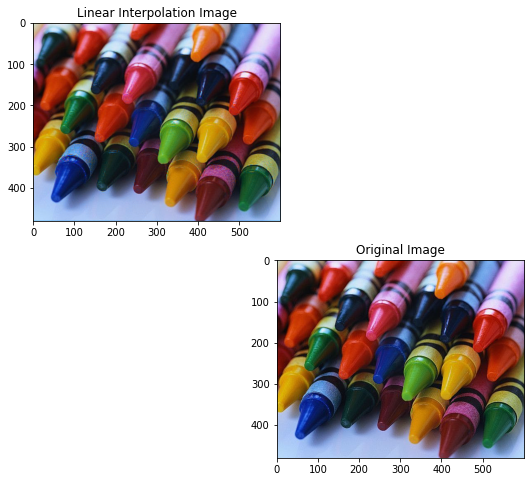

In [18]:
mosaic1_image = image_read_rgb('/content/crayons.bmp')
output1_image = linear_interpolation(mosaic1_image)
original_image = image_read_rgb('/content/crayons.jpg')
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.imshow(output1_image.astype(np.uint8))
plt.title('Linear Interpolation Image')
plt.subplot(2,1,2)
plt.imshow(original_image.astype(np.uint8))
plt.title('Original Image')

Average per-pixel error: 203.22368
Maximum per-pixel error: 53345.125


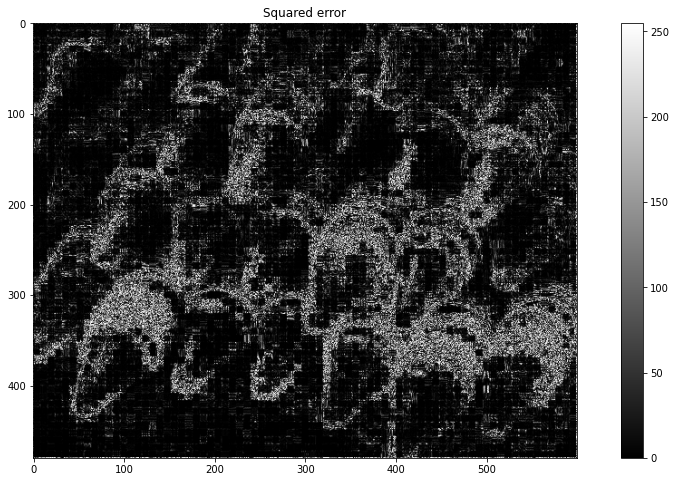

In [19]:
average_error, maximum_error = error(mosaic1_image, original_image)
print("Average per-pixel error: "+str(average_error))
print("Maximum per-pixel error: "+str(maximum_error))

In [17]:
#we got the countours after using the image_read_rgb function which actually includes the rgb color filter while reading

Text(0.5, 1.0, 'Original Image')

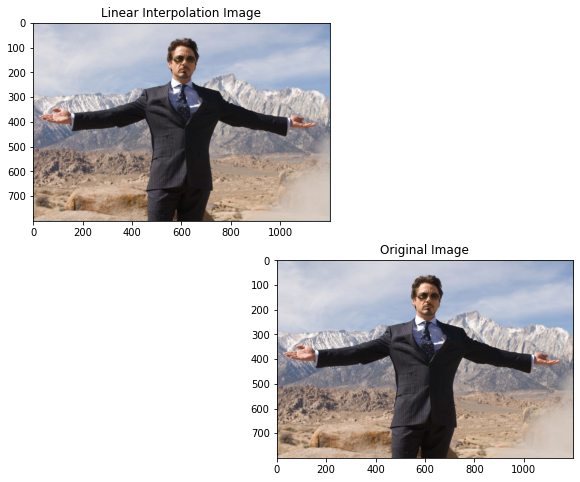

In [21]:
mosaic3_image = image_read_rgb('/content/tony.bmp')
output3_image = linear_interpolation(mosaic3_image)
original_image = image_read_rgb('/content/tony.jpg')
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.imshow(output3_image.astype(np.uint8))
plt.title('Linear Interpolation Image')
plt.subplot(2,1,2)
plt.imshow(original_image.astype(np.uint8))
plt.title('Original Image')

Text(0.5, 1.0, 'Original Image')

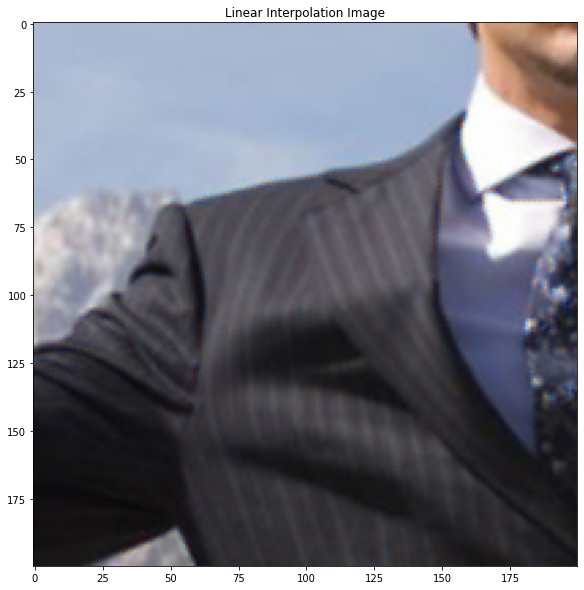

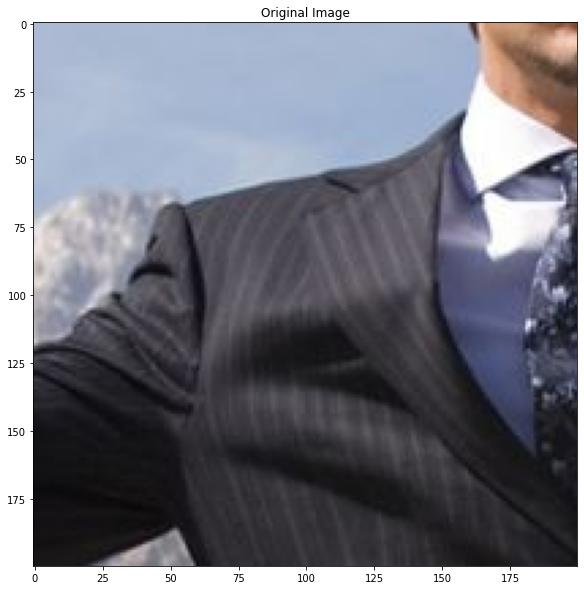

In [22]:
plt.figure(figsize= (10,10))
plt.imshow(output3_image[200:400,400:600,:].astype(np.uint8))
plt.title('Linear Interpolation Image')
plt.figure(figsize= (10,10))
plt.imshow(original_image[200:400,400:600,:].astype(np.uint8))
plt.title('Original Image')

Average per-pixel error: 57.648968
Maximum per-pixel error: 36891.562


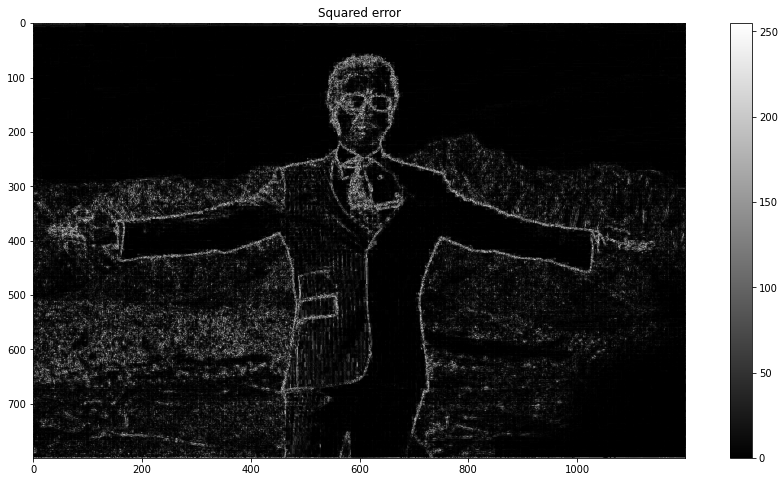

In [23]:
average_error, maximum_error = error(mosaic3_image, original_image)
print("Average per-pixel error: "+str(average_error))
print("Maximum per-pixel error: "+str(maximum_error))

In [24]:
def freeman_image(mosaic_image):

    output_image = linear_interpolation(mosaic_image) 
    
    output_image_channelred = output_image[:,:,0]
    output_image_channelgreen = output_image[:,:,1]
    output_image_channelblue = output_image[:,:,2]
    
    RG = output_image_channelred - output_image_channelgreen
    BG = output_image_channelblue - output_image_channelgreen
            
    RG = scipy.signal.medfilt2d(RG)
    BG = scipy.signal.medfilt2d(BG)
    
    R = RG + output_image_channelgreen
    B = BG + output_image_channelgreen
    G = output_image_channelgreen
    
    output_image = np.zeros([output_image.shape[0], output_image.shape[1],output_image.shape[2]])
    
    
    output_image[:,:,0] = R
    output_image[:,:,1] = G
    output_image[:,:,2] = B
    return output_image

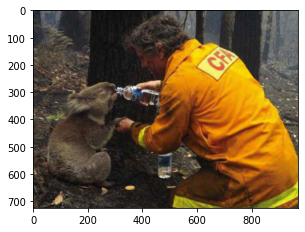

In [70]:
mosaic0_image = image_read_rgb('hope.bmp')
freeman0_image = freeman_image(mosaic0_image)
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.imshow(freeman0_image.astype(np.uint8))

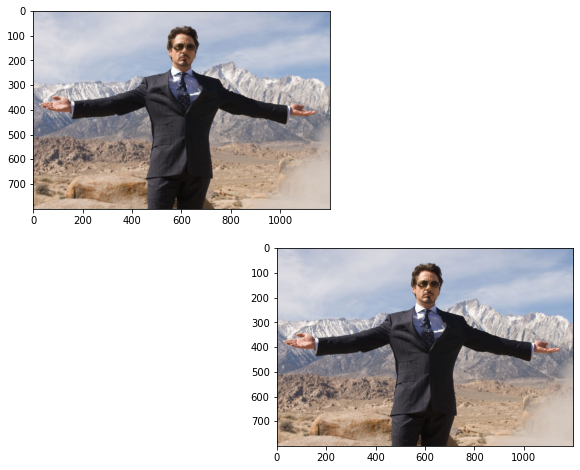

In [28]:
mosaic1_image = image_read_rgb('tony.bmp')
freeman1_image = freeman_image(mosaic1_image)
original_image = image_read_rgb('tony.jpg')
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.imshow(freeman1_image.astype(np.uint8))
plt.subplot(2,1,2)
plt.imshow(original_image.astype(np.uint8))

Text(0.5, 1.0, 'Original Image')

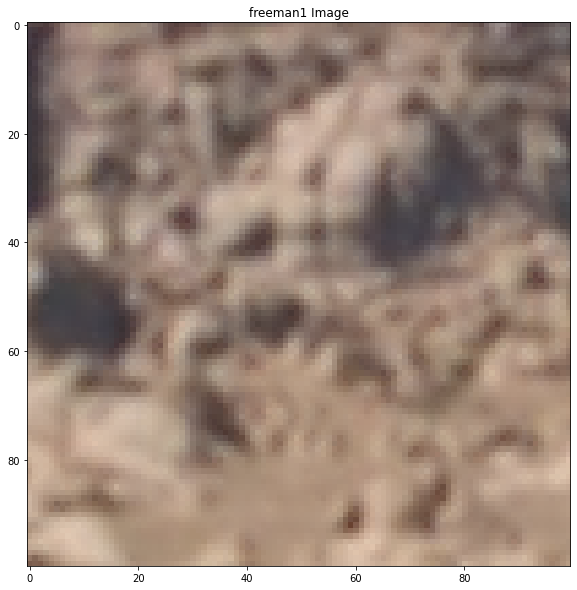

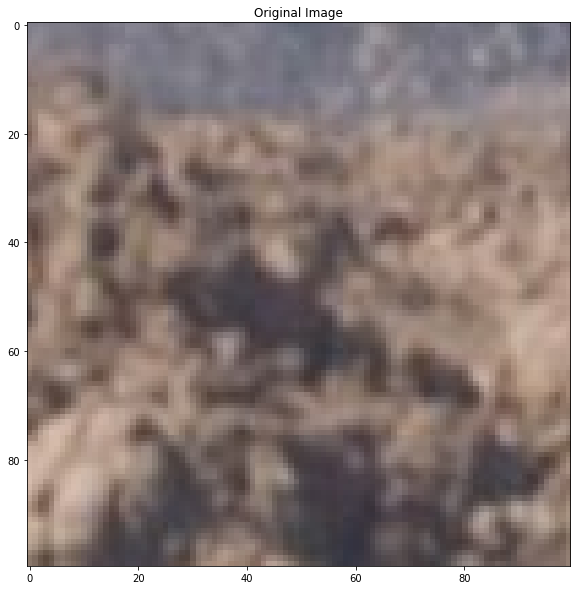

In [29]:
plt.figure(figsize= (10,10))
plt.imshow(freeman1_image[560:660,100:200,:].astype(np.uint8))
plt.title('freeman1 Image')
plt.figure(figsize= (10,10))
plt.imshow(original_image[500:600,150:250,:].astype(np.uint8))
plt.title('Original Image')


Average per-pixel error: 28.5263017578125
Maximum per-pixel error: 32278.0


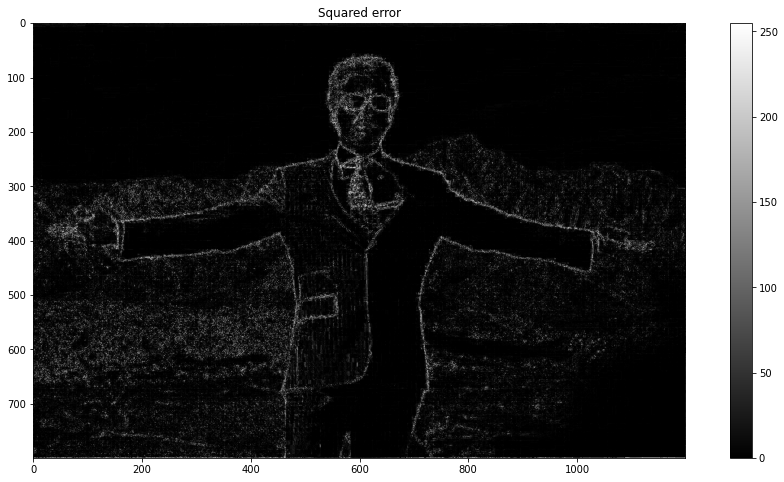

In [30]:
average_error, maximum_error = error(freeman1_image, original_image)
print("Average per-pixel error: "+str(average_error))
print("Maximum per-pixel error: "+str(maximum_error))

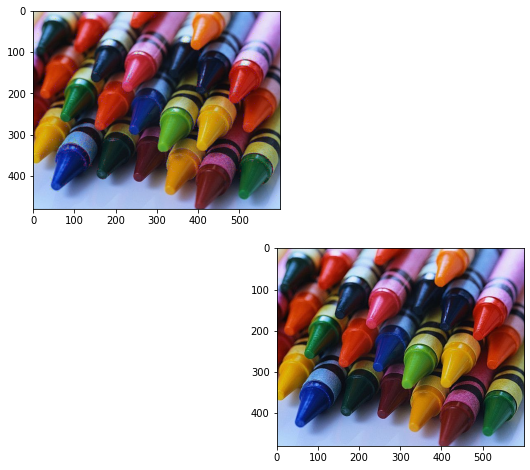

In [45]:
mosaic3_image = image_read_rgb('crayons.bmp')
freeman2_image = freeman_image(mosaic3_image)
original_image = image_read_rgb('crayons.jpg')
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.imshow(freeman2_image.astype(np.uint8))
plt.subplot(2,1,2)
plt.imshow(original_image.astype(np.uint8))

Average per-pixel error: 131.44498285590277
Maximum per-pixel error: 47857.625


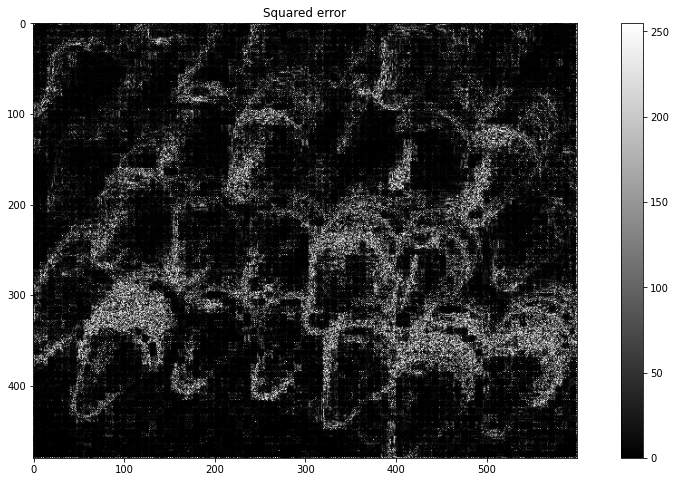

In [46]:
average_error, maximum_error = error(freeman2_image, original_image)
print("Average per-pixel error: "+str(average_error))
print("Maximum per-pixel error: "+str(maximum_error))

Text(0.5, 1.0, 'Original Image')

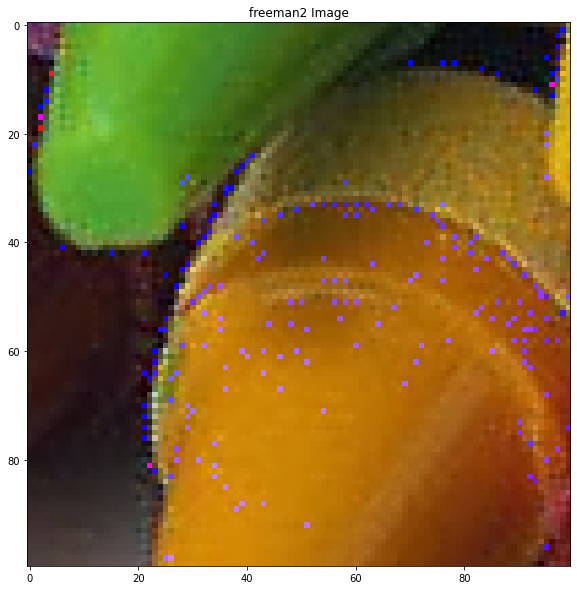

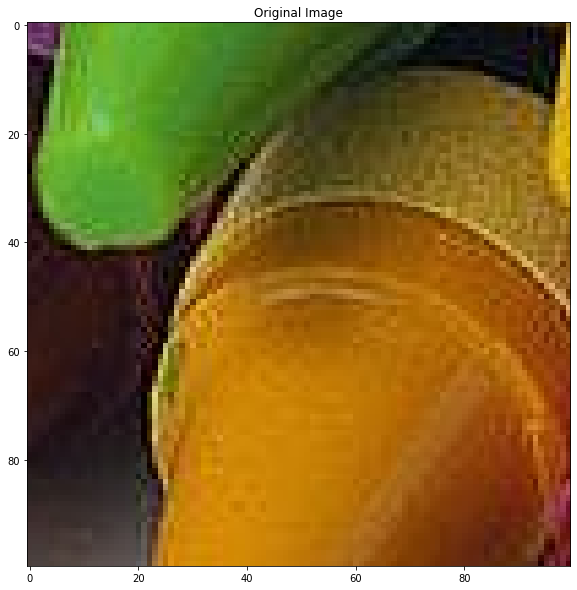

In [47]:
plt.figure(figsize= (10,10))
plt.imshow(freeman2_image[300:400,300:400,:].astype(np.uint8))
plt.title('freeman2 Image')
plt.figure(figsize= (10,10))
plt.imshow(original_image[300:400,300:400,:].astype(np.uint8))
plt.title('Original Image')


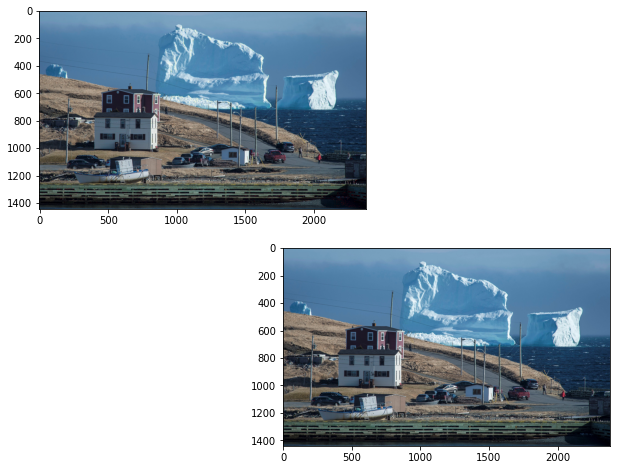

In [48]:
mosaic5_image = image_read_rgb('iceberg.bmp')
freeman3_image = freeman_image(mosaic5_image)
original_image = image_read_rgb('iceberg.jpg')
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.imshow(freeman3_image.astype(np.uint8))
plt.subplot(2,1,2)
plt.imshow(original_image.astype(np.uint8))

Text(0.5, 1.0, 'Original Image')

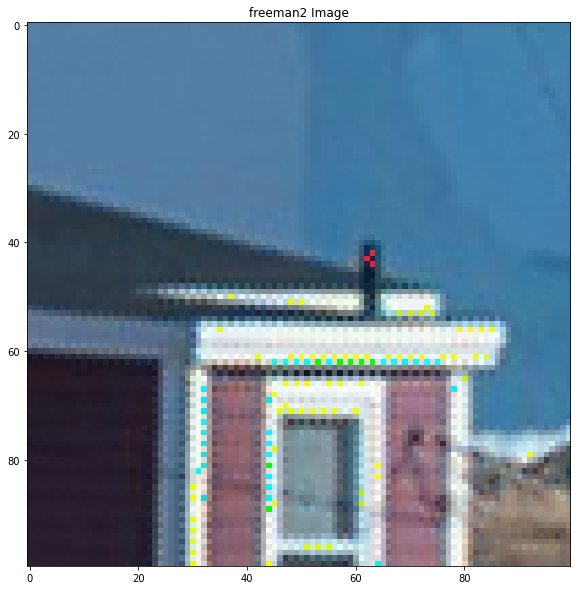

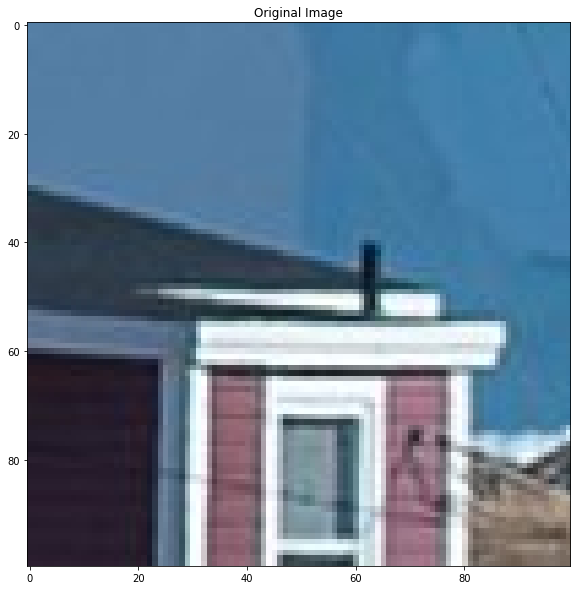

In [51]:
plt.figure(figsize= (10,10))
plt.imshow(freeman3_image[550:650,800:900,:].astype(np.uint8))
plt.title('freeman2 Image')
plt.figure(figsize= (10,10))
plt.imshow(original_image[550:650,800:900,:].astype(np.uint8))
plt.title('Original Image')


Average per-pixel error: 71.28703005833682
Maximum per-pixel error: 33839.5625


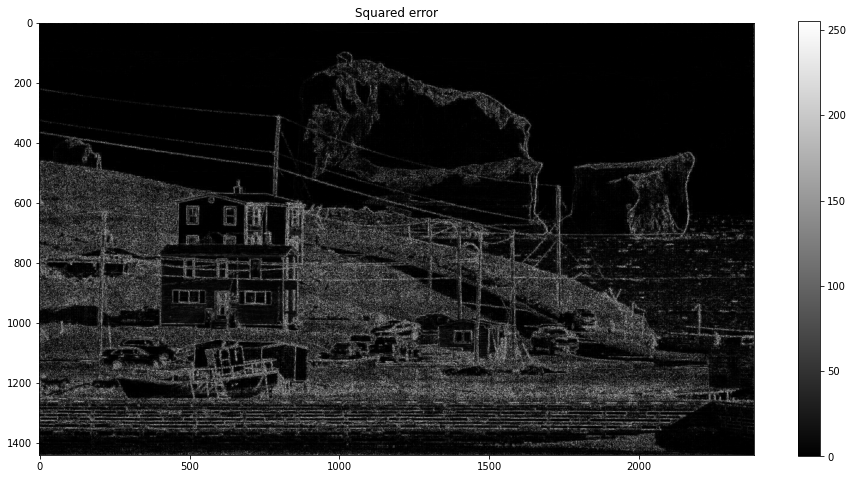

In [52]:
average_error, maximum_error = error(freeman3_image, original_image)
print("Average per-pixel error: "+str(average_error))
print("Maximum per-pixel error: "+str(maximum_error))